<a href="https://colab.research.google.com/github/SunkaraboinaPraveenKumar/Machine_Learning_Projects/blob/main/Viz_Multi_head_attention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-Head Attention Visualized

In [1]:
!pip install bertviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 32.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 49.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.6/139.6 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
from bertviz.transformers_neuron_view import BertModel, BertTokenizer
from bertviz.neuron_view import show

sentence_a = "The artist painted the portrait of a woman with a brush"

model_type = 'bert'
model_version = 'bert-base-uncased'
model = BertModel.from_pretrained(model_version, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=True)
show(model, model_type, tokenizer, sentence_a, layer=4, head=3)

100%|██████████| 231508/231508 [00:00<00:00, 3006061.35B/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

BertSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


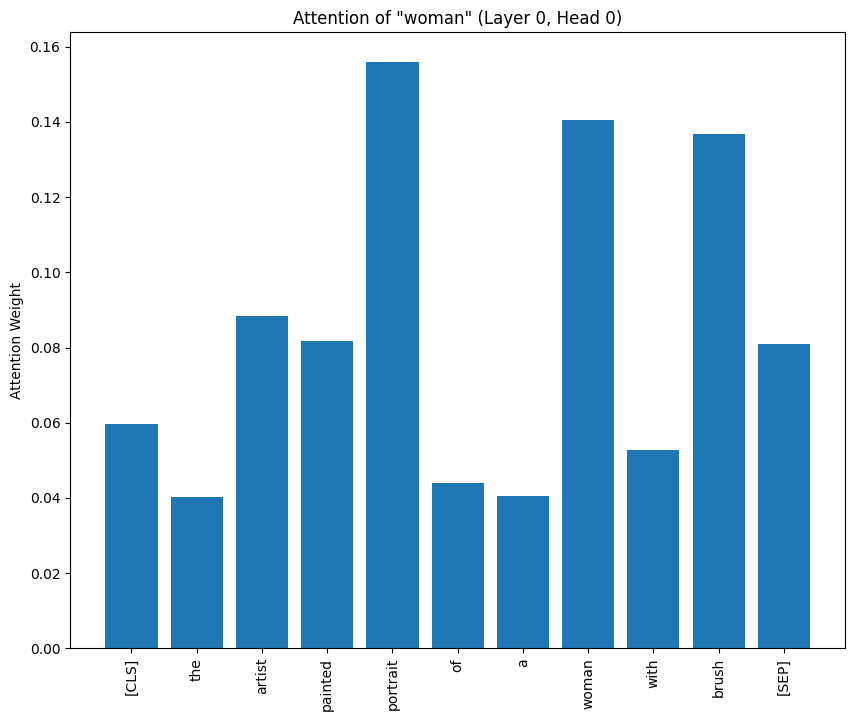

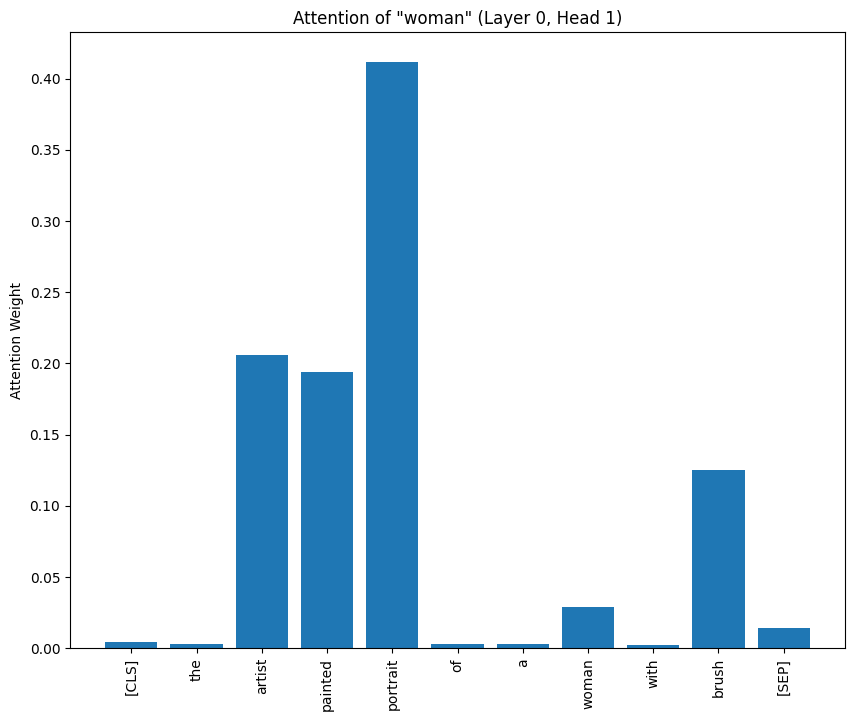

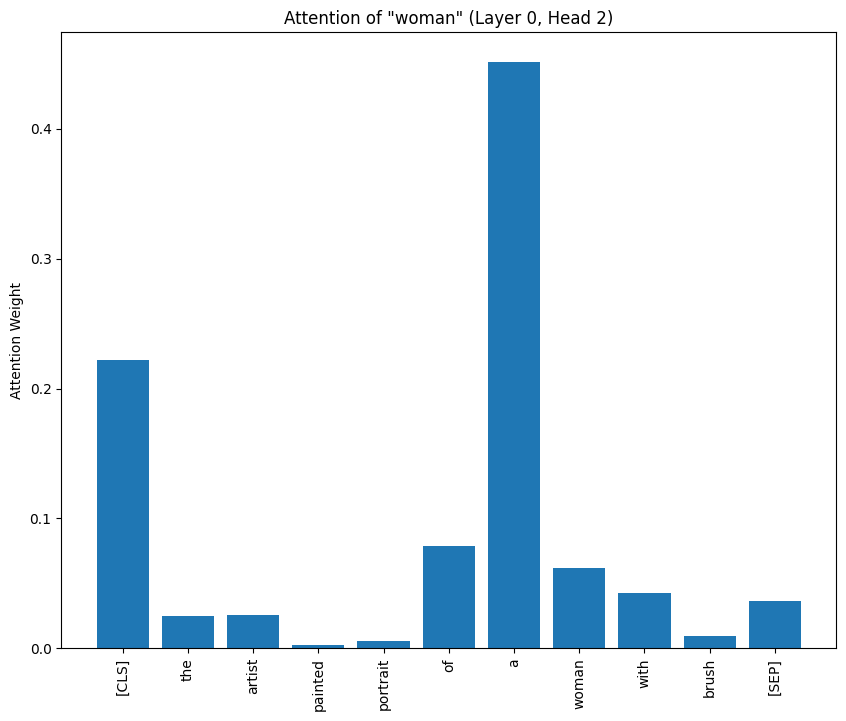

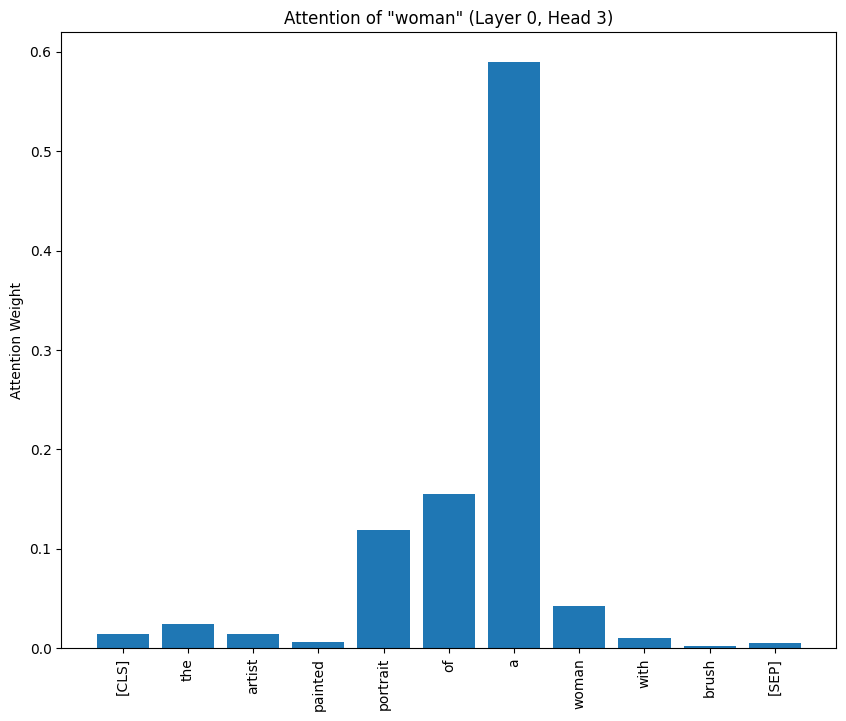

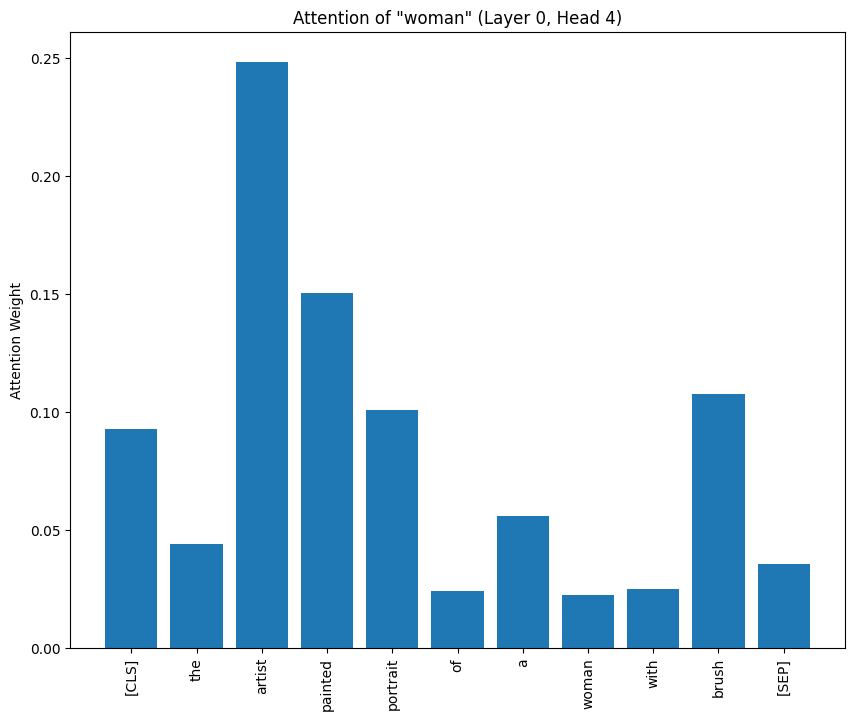

...

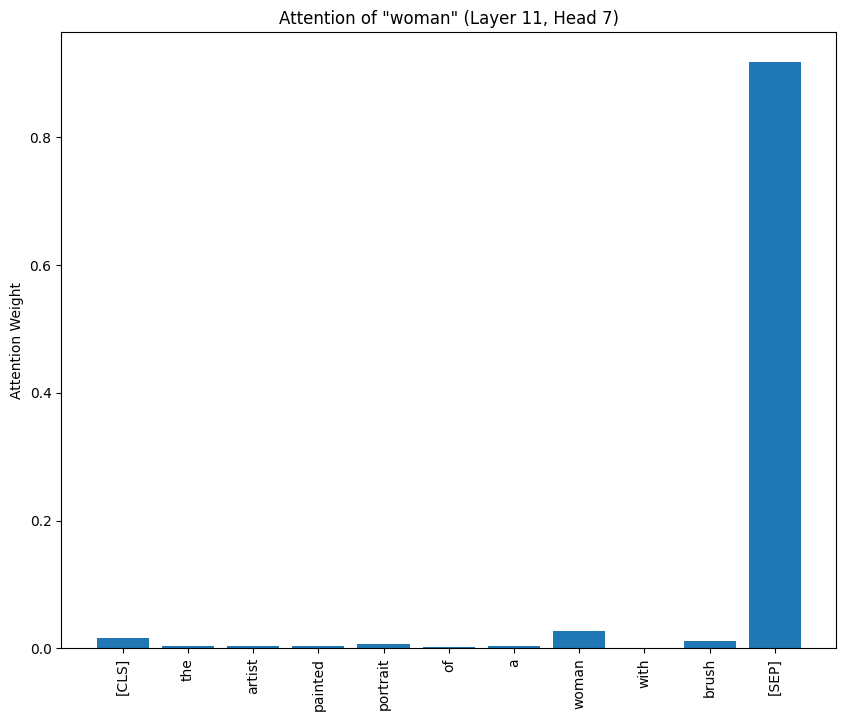

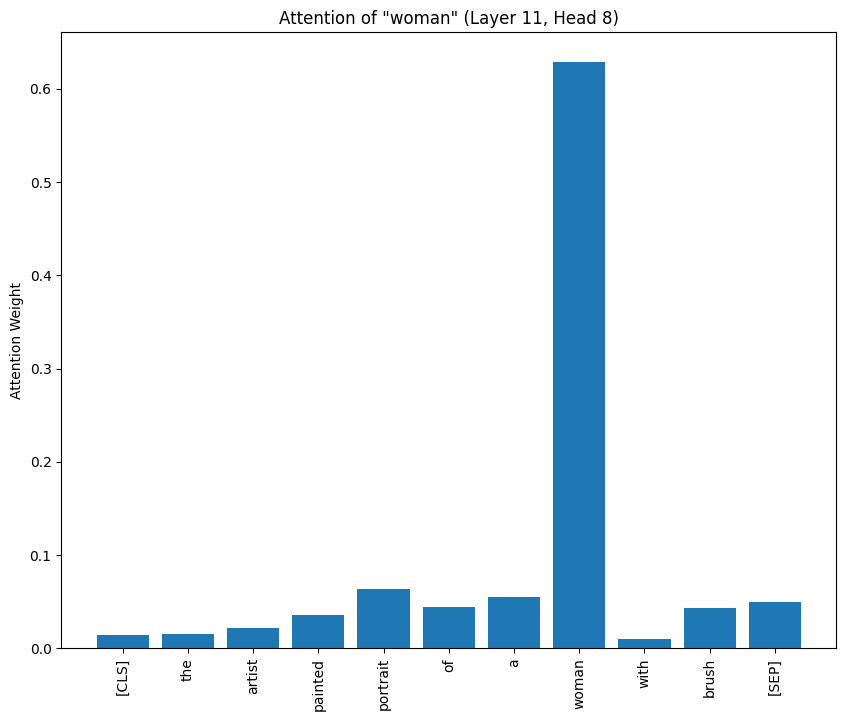

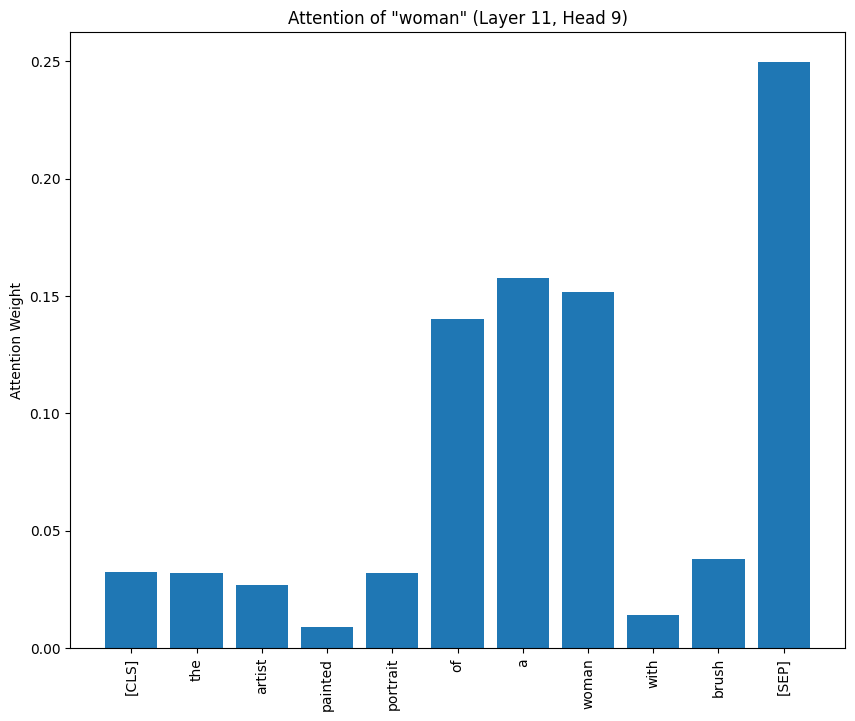

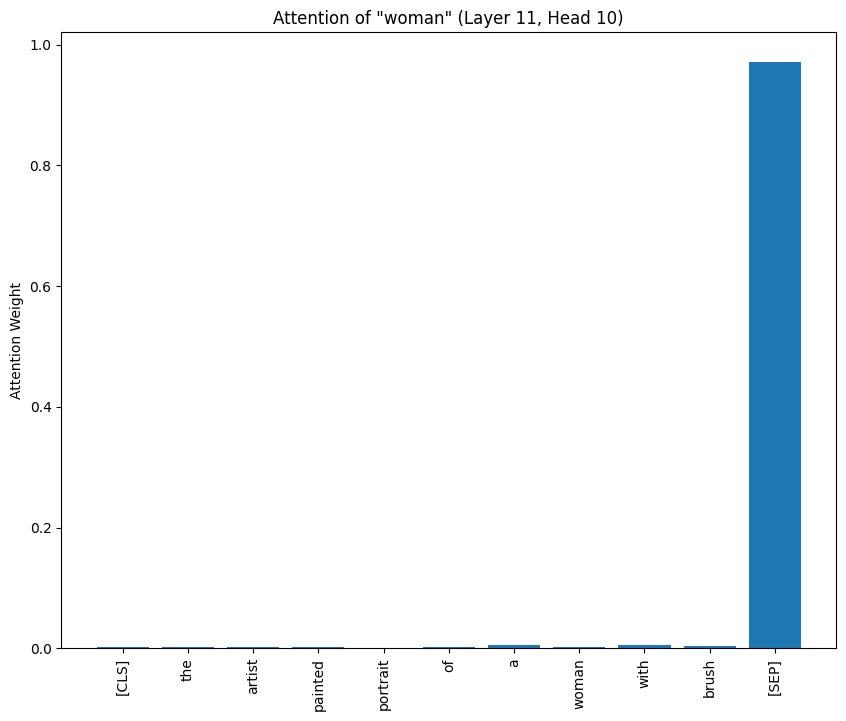

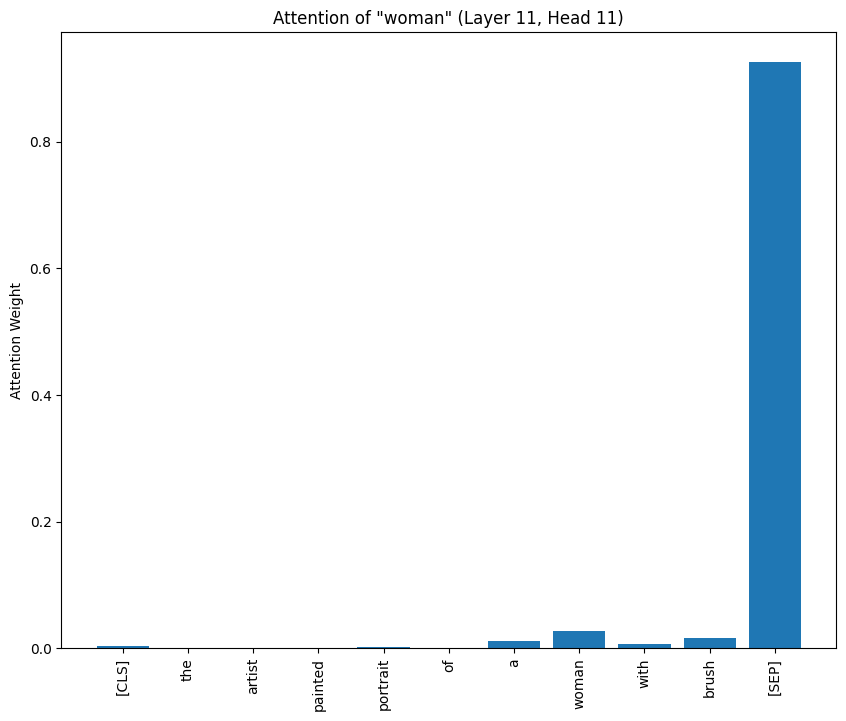

In [3]:
import torch
import matplotlib.pyplot as plt
from transformers import BertTokenizer, BertModel
from bertviz.neuron_view import show

# Load pre-trained BERT model and tokenizer
model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name, output_attentions=True)

# Example sentence
sentence = "The artist painted the portrait of a woman with a brush"

# Tokenize the input sentence
inputs = tokenizer(sentence, return_tensors='pt')
tokens = tokenizer.tokenize(sentence)
tokens = ['[CLS]'] + tokens + ['[SEP]']  # Add special tokens

# Find the index of the token "woman"
woman_index = tokens.index('woman')

# Forward pass to get outputs and attention weights
outputs = model(**inputs, output_attentions=True)
attentions = outputs.attentions  # List of attention layers (one for each layer)

# Function to visualize the attention for the token "woman"
def visualize_attention_for_woman(layer_idx, head_idx):
    # Get attention weights for the given layer and head
    attention_weights = attentions[layer_idx][0, head_idx].detach().numpy()

    # Get the attention values where "woman" is attending to other tokens
    woman_attention = attention_weights[woman_index]

    # Plot the attention map for the "woman" token
    plt.figure(figsize=(10, 8))
    plt.bar(tokens, woman_attention)
    plt.xticks(rotation=90)
    plt.ylabel('Attention Weight')
    plt.title(f'Attention of "woman" (Layer {layer_idx}, Head {head_idx})')
    plt.show()

# Iterate over all layers and heads to visualize the attention of "woman"
for layer_idx in range(len(attentions)):  # Loop through each layer
    for head_idx in range(attentions[layer_idx].size(1)):  # Loop through each head in the layer
        visualize_attention_for_woman(layer_idx, head_idx)


# Next steps

Visit the [github repository](https://github.com/jessevig/bertviz) for full documentation and additional use cases. Check out the [blog](https://towardsdatascience.com/deconstructing-bert-part-2-visualizing-the-inner-workings-of-attention-60a16d86b5c1) for a deep dive on BertViz and the attention mechanism.